In [1]:
import sys
sys.path.append("../Python")
import pandas as pd
import matplotlib.pyplot as plt
from describe import MyDescribe


In [2]:
# Read dataset
gaugeNames = ["Mean Radius","Mean Texture","Mean Perimeter","Mean Area","Mean Smoothness","Mean Compactness","Mean Concavity","Mean Concave points","Mean Symmetry","Mean Fractal dimension",
               "Radius SE","Texture SE","Perimeter SE","Area SE","Smoothness SE","Compactness SE","Concavity SE","Concave points SE","Symmetry SE","Fractal dimension SE",
               "Worst Radius","Worst Texture","Worst Perimeter","Worst Area","Worst Smoothness","Worst Compactness","Worst Concavity","Worst Concave points","Worst Symmetry","Worst Fractal dimension"]
columnNames = []
columnNames.extend(["ID number","Diagnosis"])
columnNames.extend(gaugeNames)
dataset_training = pd.read_csv("../Data/data.csv", header=None, names=columnNames)
print(dataset_training.T)


                              0         1         2         3         4    \
ID number                  842302    842517  84300903  84348301  84358402   
Diagnosis                       M         M         M         M         M   
Mean Radius                 17.99     20.57     19.69     11.42     20.29   
Mean Texture                10.38     17.77     21.25     20.38     14.34   
Mean Perimeter              122.8     132.9     130.0     77.58     135.1   
Mean Area                  1001.0    1326.0    1203.0     386.1    1297.0   
Mean Smoothness            0.1184   0.08474    0.1096    0.1425    0.1003   
Mean Compactness           0.2776   0.07864    0.1599    0.2839    0.1328   
Mean Concavity             0.3001    0.0869    0.1974    0.2414     0.198   
Mean Concave points        0.1471   0.07017    0.1279    0.1052    0.1043   
Mean Symmetry              0.2419    0.1812    0.2069    0.2597    0.1809   
Mean Fractal dimension    0.07871   0.05667   0.05999   0.09744   0.05883   

In [3]:
myDescribe = MyDescribe()
describe_list = myDescribe.createDescribeDataFrame(dataset_training, False, False, gaugeNames)
my_describe_df = pd.DataFrame(describe_list, index=gaugeNames)
print(my_describe_df)



                         Count        Mean         Std      Median  \
Mean Radius                569   14.127292    3.520951   13.370000   
Mean Texture               569   19.289649    4.297255   18.840000   
Mean Perimeter             569   91.969033   24.277619   86.240000   
Mean Area                  569  654.889104  351.604754  551.100000   
Mean Smoothness            569    0.096360    0.014052    0.095870   
Mean Compactness           569    0.104341    0.052766    0.092630   
Mean Concavity             569    0.088799    0.079650    0.061540   
Mean Concave points        569    0.048919    0.038769    0.033500   
Mean Symmetry              569    0.181162    0.027390    0.179200   
Mean Fractal dimension     569    0.062798    0.007054    0.061540   
Radius SE                  569    0.405172    0.277069    0.324200   
Texture SE                 569    1.216853    0.551163    1.108000   
Perimeter SE               569    2.866059    2.020077    2.287000   
Area SE             

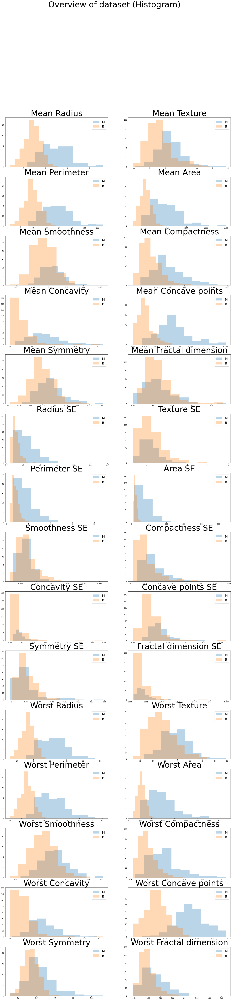

In [11]:
legends = ["M", "B"]
fig, axes = plt.subplots(int(len(gaugeNames) / 2), 2, figsize=(25, 100))
axes = axes.flatten()
for i in range(0, len(gaugeNames)):
    for legend in legends:
        legendIndexList = dataset_training.where(dataset_training["Diagnosis"] == legend).dropna().index
        axes[i].hist(dataset_training[gaugeNames[i]][legendIndexList],
        alpha=0.3)
    axes[i].set_title(gaugeNames[i], fontsize=50)
    axes[i].legend(legends, fontsize=20)
title = "Overview of dataset (Histogram)"
plt.suptitle(title, fontsize=50)
plt.show()

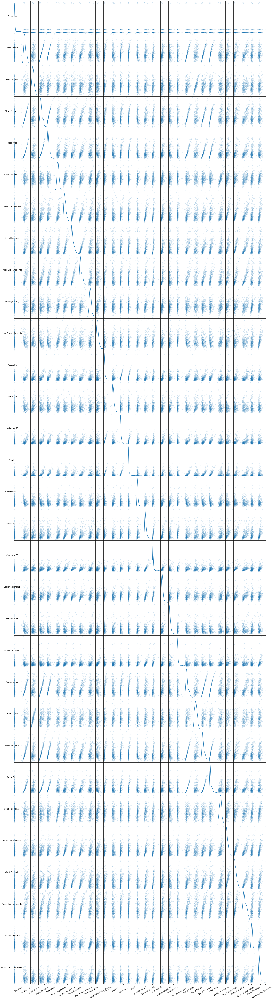

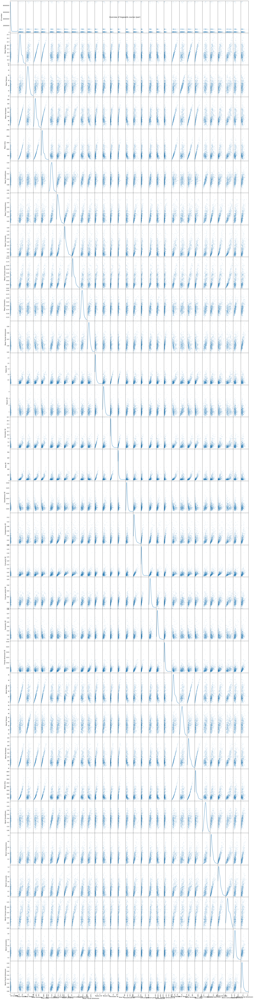

In [7]:
# color_set = hogwartsSubjects.getColorSet()
# hogwartsSubjects_df = hogwartsSubjects_df.fillna(hogwartsSubjects_df.mean())
# houses = hogwartsSubjects.getHouseList()
# axes = pd.plotting.scatter_matrix(hogwartsSubjects_df, alpha=0.2,
#                                   diagonal="kde", color=color_set)
axes = pd.plotting.scatter_matrix(dataset_training, alpha=0.2,
                                  diagonal="kde", figsize=(25, 100))
axes2 = pd.plotting.scatter_matrix(dataset_training, alpha=0.2,
                                  diagonal="kde", figsize=(25, 100))
axes = axes.flatten()
# subjectList = hogwartsSubjects.getSubjectList()
for i in range(0, len(axes)):
    axes[i].xaxis.label.set_rotation(30)
    axes[i].yaxis.label.set_rotation(0)
    axes[i].set_xticklabels([])
    axes[i].set_yticklabels([])
color_list = ["blue", "red", "green", "black"]
handles = [plt.plot([],[],color=color_list[i], ls="", marker=".", \
                    markersize=12)[0] for i in range(4)]
# labels=houses
# plt.legend(handles, labels, loc=(1.02,0))
title = "Overview of Hogwards courses (pair)"
plt.suptitle(title)
plt.tight_layout()
plt.gcf().subplots_adjust(wspace=0, hspace=0)
plt.show()